In [1]:
import numpy as np
import pandas as pd 
from pathlib import Path
import matplotlib.pyplot as plt 

%matplotlib inline 

#### 1. Load the data of parameterization of each reservoir simulation run.

Column introduction:

    case_num: case number of each simulation run, shared and matched between df_param and df_ts;
    
    category: 'train' or 'test' tag pointing to training and testing case_num for machine/deep learning models, 20% data for                    testing, and 80% data for training purpose.

    Kh_Kv: permeability anisotropic ratio, range: 1 to 100;

    inj_rate: constant water injection rate at injection well, range: 1000 to 3000 STB/Day;

    permeability: reservoir permeability in horizontal plane or (x, y directions), range: 50 to 500 md;

    porosity: reservoir porosity, range: 0.1 to 0.3;

    prod_bhp: constant bottom-hole pressure at production well, range: 200 to 1000 psia;

    thickness: reservoir thickness, range: 10 to 100 ft;

In [2]:
# Load static data 
df_param = pd.read_csv('parameters.csv')

In [3]:
# data dimension
df_param.shape

(1000, 8)

In [4]:
df_param.head(20) 

,case_num,category,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness
0,0,train,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632
1,1,train,96.690954,2216.996775,127.801703,0.265198,672.408364,50.103320
2,2,train,45.990485,1494.508214,321.702554,0.109952,532.563399,73.410282
3,3,train,88.322302,2242.513803,427.275505,0.137530,976.777682,37.443929
4,4,train,27.823837,2994.073285,398.741243,0.220836,465.207942,15.788940
5,5,train,49.376005,1289.673511,242.772655,0.136013,874.179324,51.021977
6,6,train,68.025133,1701.870338,116.347334,0.226201,664.151494,25.855127
7,7,train,21.987688,2914.393603,69.714149,0.244081,660.193827,20.884281
8,8,train,49.742721,1634.952561,325.446493,0.147798,395.909714,20.584933
9,9,test,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153


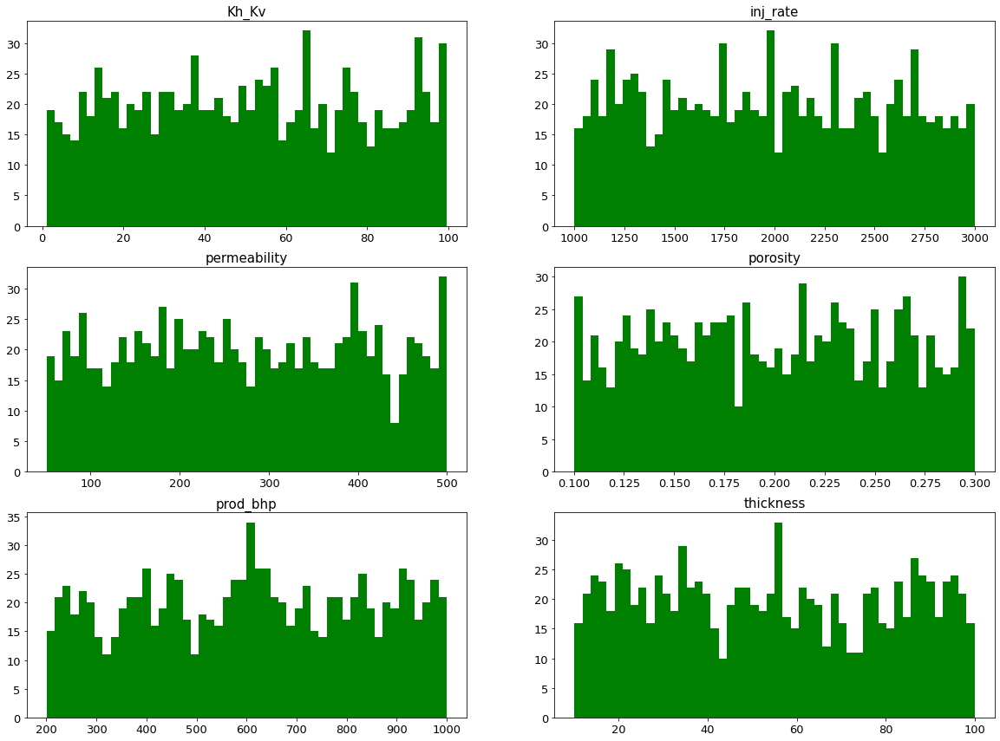

In [5]:
attributes = ['Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp', 'thickness']

fs = 15
plt.figure(figsize=(20, 20))
for i, col in enumerate(attributes, 1):
    plt.subplot(4, 2, i)
    plt.hist(df_param[col], bins=50, density=False, color='green')
    plt.title(col, fontsize=fs)
    plt.xticks(fontsize=fs-2)
    plt.yticks(fontsize=fs-2)

#### 2. Load the data of time series data of each reservoir simulation run.

Column introduction:

    case_num: case number of each simulation run, shared and matched between df_param and df_ts;
    
    days: day of each time step of simulation output data, unit: day;

    years: days / 365.0, unit: year;

    oil_prod_rate: oil production rate at each time step, unit: STB/day;

    oil_prod_cum: cumulative oil production volume at each time step, it is an integration of oil_prod_rate with regards to                       days, unit: STB;

    water_inj_rate: water injection rate at each time step, unit: STB;

    water_inj_cum: cumulative water injection volume at each time step, it is an integration of water_inj_rate with regards to   days, unit: STB;

In [6]:
# Load static data 
df_ts = pd.read_csv('production.csv')

In [7]:
df_ts.columns

Index(['case_num', 'days', 'years', 'oil_prod_rate', 'oil_prod_cum',
       'water_inj_rate', 'water_inj_cum'],
      dtype='object')

In [8]:
df_ts.head(10)

,case_num,days,years,oil_prod_rate,oil_prod_cum,water_inj_rate,water_inj_cum
0,0,0,0.000000,0.00,0,0.00,0.0
1,0,31,0.084932,26614.00,825035,1740.71,53962.1
2,0,62,0.169863,21427.70,1489290,1740.71,107924.0
3,0,93,0.254795,18809.70,2072390,1740.71,161886.0
4,0,124,0.339726,16676.60,2589370,1740.71,215848.0
5,0,155,0.424658,14810.90,3048500,1740.71,269810.0
6,0,186,0.509589,13181.00,3457110,1740.71,323772.0
7,0,217,0.594521,11756.60,3821570,1740.71,377734.0
8,0,248,0.679452,10510.50,4147390,1740.71,431696.0
9,0,279,0.764384,9416.27,4439300,1740.71,485658.0


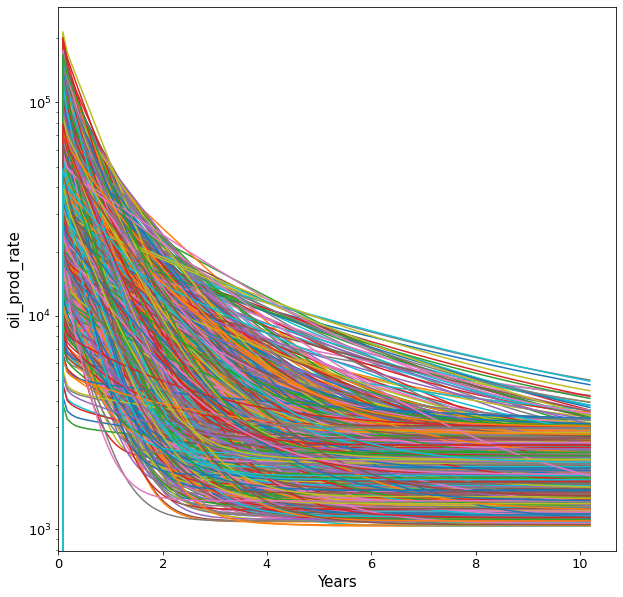

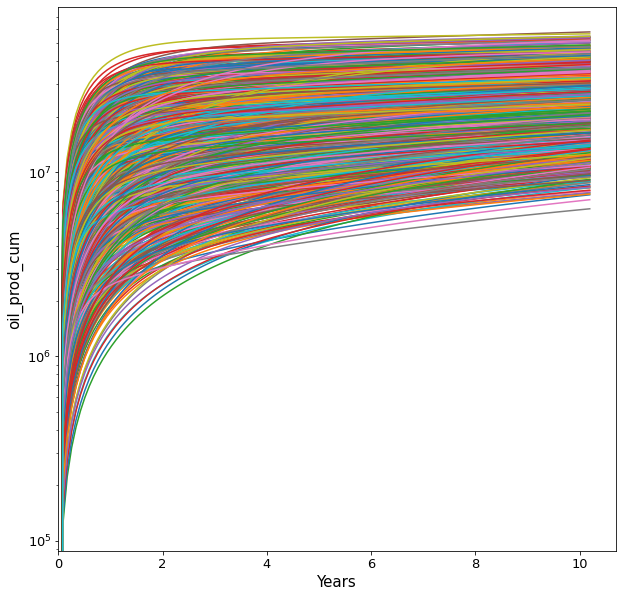

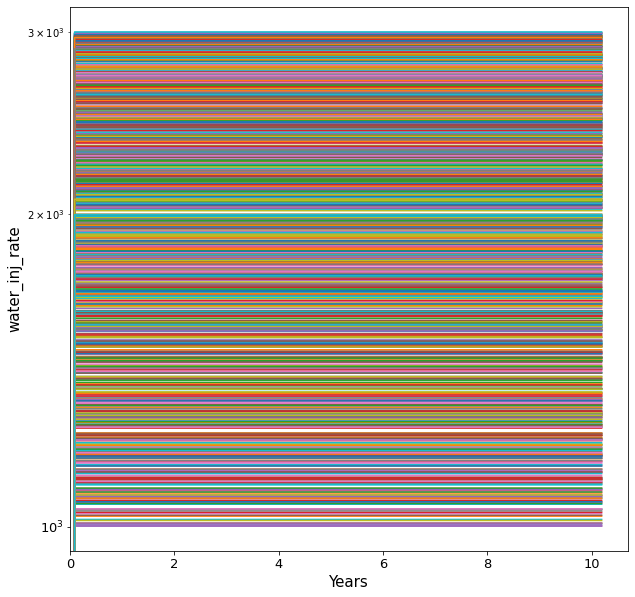

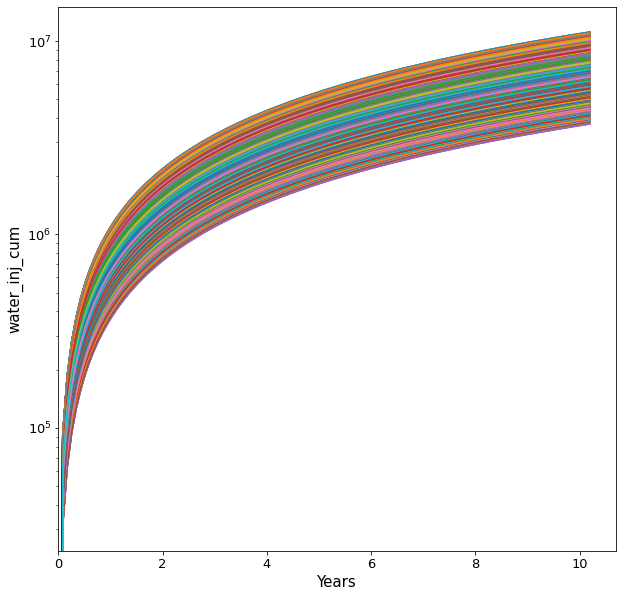

In [9]:
# Plot oil production rate
def plot_ts(df_ts, col='oil_prod_rate'):
    
    fs = 15
    
    plt.figure(figsize=(10, 10))

    for i, case in enumerate(df_ts['case_num'].unique(), 1):

        df = df_ts[(df_ts['case_num'] == case)]

        plt.semilogy(df['years'], df[col])
            
    plt.xlabel('Years', fontsize=fs)
    plt.ylabel(f'{col}', fontsize=fs)
    plt.xticks(fontsize=fs-2)
    plt.yticks(fontsize=fs-2)
    plt.xlim(xmin=0)

    plt.show()
    
# Plot the time series data 
plot_ts(df_ts, col='oil_prod_rate')
plot_ts(df_ts, col='oil_prod_cum')
plot_ts(df_ts, col='water_inj_rate')
plot_ts(df_ts, col='water_inj_cum')

### 3. Project start.

Before we start, it is good to know that the test and training cases (simulation runs) are splitted based on the 'category' column in df_param dataframe, and the dataframes df_ts and df_param sharing the same column, which is 'case_num'.

Test cases will never be involved in the training and/or validation processes.

#### Objective 1 (30 Points):

Develop a machine/deep learning model (sklearn or PyTroch) to predict cumulative oil production volume at 10 years.

Basic deliverables (can be more than this):

(1) The RMSE value (without normalization) of testing data (can be obtained by get_rmse function below);

(2) The R2 score of testing data (can be otained by sklearn.metrics.r2_score);

(3) The parity (scattered) plot with true results and predicted values for testing data;

(4) If you do feature selection, good to also present the feature importance of each feature your select, or your rationale why you add or drop a feature to train the machine learning model. 

Hints:
Input can be columns ['Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp', 'thickness'] in df_param or less;
Output need to be firstly calcualte the cumulative oil production volume at 10 years based on the information in df_ts.

#### Objective 2 (40 Points):
Develop machine/deep learning model(s) (sklearn or PyTroch) which is able to predict oil production rate at year 1, 2, 3, 4, 5, 6, 7, 8, 9, 10 simultaneously (not the scenario of time window sliding that we know oil production rate at year 1, and then predict the same variable at year 2 or later years).

Basic deliverables (can be more than this):

(1) The RMSE value (without normalization) of testing data;

(2) The R2 score of testing data;

(3) The parity (scattered) plot with true results and predicted values for testing data, all data points without normalization;

(4) Plot the time series of each testing case: year vs oil production rate at each year for both true results and predicted values, all data points without normalization;

(5) If you do feature selection, good to also present the feature importance of each feature your select, or your rationale why you add or drop a feature to train the machine learning model.

Hints: 

Input can be columns ['Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp', 'thickness'] in df_param and column 'years' in df_ts, but you also choose less features for sure. 

Output need to be firstly calcualte the oil production rate at each year (year = 1, 2, ..., 10) based on the information in df_ts.

Flexibility: 

You are allowed to train either a single machine/deep learning model or multiple machine/deep learning models to predict the 10 oil production rate.

#### Objective 3: Summary and Presentation (30 Points).

In [13]:
# Utility function
def get_rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_pred-y_true)**2.0)) 

def get_rel_l2_error(y_true, y_pred):
    return np.linalg.norm(y_true-y_pred, 2) / np.linalg.norm(y_true, 2)

# Objective 1 - Cumulative oil Production

## Develop a machine/deep learning model (sklearn or PyTroch) to predict cumulative oil production volume at 10 years.

In [9]:
import imageio
import numpy as np
import pandas as pd 
from pathlib import Path 
import matplotlib.pyplot as plt 
from IPython.display import Image
import seaborn as sns
import time

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import median_absolute_error
from sklearn.metrics import mean_absolute_error


In [ ]:
import time
start_time = time.time()
main()
print("--- %s seconds ---" % (time.time() - start_time))

In [10]:
# Utility function
def get_rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_pred-y_true)**2.0)) 

def get_rel_l2_error(y_true, y_pred):
    return np.linalg.norm(y_true-y_pred, 2) / np.linalg.norm(y_true, 2)

In [11]:
# Load static data 
df_param = pd.read_csv('parameters.csv')
# Load static data 
df_ts = pd.read_csv('production.csv')

In [12]:
df_ts.columns

Index(['case_num', 'days', 'years', 'oil_prod_rate', 'oil_prod_cum',
       'water_inj_rate', 'water_inj_cum'],
      dtype='object')

In [13]:
# find the cumulitive production of each year

x = df_ts['years']
y = df_ts['oil_prod_cum']
tms = 0
yearlyProdCum = []
yearstep = []
cn = []
cases = df_ts['case_num'].unique()
for case in cases:
    for year in range(0,11):
        yearlyProdCum.append(np.interp(year, x[tms:tms+121],y[tms:tms+121]))
        yearstep.append(year)
        cn.append(case)
    tms+=121


In [14]:
# find the  oil_prod_rate of each year
x2 = df_ts['years']
y2 = df_ts['oil_prod_rate']
tms = 0
yearlyProdRate = []
cases = df_ts['case_num'].unique()
for case in cases:
    for year in range(0,11):
        yearlyProdRate.append(np.interp(year, x2[tms:tms+121],y2[tms:tms+121]))
    tms+=121


In [16]:
# yearlyProdCum

In [18]:
# yearlyProdRate

In [19]:
column_names = [ 'cn', 'yearstep','yearlyProdCum','yearlyProdRate']
df_validation = pd.DataFrame(columns = column_names)
df_validation['yearlyProdCum']=yearlyProdCum
df_validation['cn']=cn
df_validation['yearstep']=yearstep
df_validation['yearlyProdRate']=yearlyProdRate

In [20]:
df_validation.head()

,cn,yearstep,yearlyProdCum,yearlyProdRate
0,0,0,0.000000e+00,0.000000
1,0,1,5.102400e+06,7043.058708
2,0,2,6.653018e+06,2864.340000
3,0,3,7.489690e+06,2008.434194
4,0,4,8.180167e+06,1833.900323


In [21]:
df_validation_final = df_validation

Kh_Kv = []
inj_rate = []
permeability = []
porosity = []
prod_bhp = []
thickness = []
category = []

for cases in df_validation_final['cn']:   
        Kh_Kv.append(df_param['Kh_Kv'][cases])
        inj_rate.append(df_param['inj_rate'][cases])
        permeability.append(df_param['permeability'][cases])
        porosity.append(df_param['porosity'][cases])
        prod_bhp.append(df_param['prod_bhp'][cases])
        thickness.append(df_param['thickness'][cases])
        category.append(df_param['category'][cases])


In [22]:
df_validation_final['Kh_Kv']=Kh_Kv
df_validation_final['inj_rate']=inj_rate
df_validation_final['permeability']=permeability
df_validation_final['porosity']=porosity
df_validation_final['prod_bhp']=prod_bhp
df_validation_final['thickness']=thickness
df_validation_final['category']=category

In [23]:
df_validation_final.head()

,cn,yearstep,yearlyProdCum,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
0,0,0,0.000000e+00,0.000000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
1,0,1,5.102400e+06,7043.058708,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
2,0,2,6.653018e+06,2864.340000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
3,0,3,7.489690e+06,2008.434194,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
4,0,4,8.180167e+06,1833.900323,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train


In [24]:
dataset_train_PC = df_validation_final.loc[df_validation_final['category']=='train']
dataset_test_PC = df_validation_final.loc[df_validation_final['category']=='test']

In [25]:
feature_cols = ['yearstep','Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp', 'thickness']
label_col = ['yearlyProdCum']

In [26]:
# Only take the training data to build the model first
X_train = dataset_train_PC[feature_cols].values
Y_train = dataset_train_PC[label_col].values

In [27]:
# Define scalers based on MinMax, but you can also try Standard Scaler
input_scaler = MinMaxScaler().fit(X_train)
output_scaler = MinMaxScaler().fit(Y_train)

# Transform data
X_train_scaled = input_scaler.transform(X_train)
Y_train_scaled = output_scaler.transform(Y_train)

# Flatten Y to avoid warning in fit models
Y_train_scaled = Y_train_scaled.flatten()

# Choosing model

In [28]:
# Test options and evaluation metric
num_folds = 10 # Split the dataset into 10 folds(parts), train model on 9 folds and hold 1 fold for cross validation
seed = 7
scoring = 'neg_root_mean_squared_error' # Root Mean Squared Error

In [29]:
# Spot-Check Algorithms
models = []
models.append(('LR', LinearRegression()))
models.append(('RF', RandomForestRegressor())) 
models.append(('GBM', GradientBoostingRegressor()))
models.append(('SVR', SVR()))


In [30]:
# evaluate each model in turn
results = []
names = []
time_PC = []

for name, model in models:
    start_time = time.time()
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train_scaled, Y_train_scaled, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    time_PC.append(time.time() - start_time)
    print(msg)
    print("--- %s seconds ---" % (time.time() - start_time))

LR: -0.091749 (0.002345)
--- 0.09485650062561035 seconds ---
RF: -0.012059 (0.000704)
--- 19.16584849357605 seconds ---
GBM: -0.022015 (0.000960)
--- 5.781186819076538 seconds ---
SVR: -0.049804 (0.001457)
--- 1.953169584274292 seconds ---


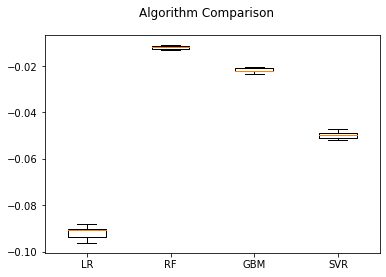

In [31]:
# Compare Algorithms
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [34]:
param_grid = {
    'n_estimators': np.array([50,100,150,200,250,300,350,400])
}

In [35]:
# Grid search is an approach to parameter tuning that will methodically build and evaluate a model
# - for each combination of algorithm parameters specified in a grid. You can perform a grid search 
# - using the GridSearchCV class.

model = GradientBoostingRegressor(random_state=seed)
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
grid_result = grid.fit(X_train_scaled, Y_train_scaled)

In [36]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: -0.014593 using {'n_estimators': 400}
-0.032470 (0.001446) with: {'n_estimators': 50}
-0.022015 (0.000960) with: {'n_estimators': 100}
-0.019592 (0.000847) with: {'n_estimators': 150}
-0.018326 (0.000794) with: {'n_estimators': 200}
-0.017120 (0.000695) with: {'n_estimators': 250}
-0.016098 (0.000641) with: {'n_estimators': 300}
-0.015196 (0.000596) with: {'n_estimators': 350}
-0.014593 (0.000590) with: {'n_estimators': 400}


In [32]:
X_test = dataset_test_PC[feature_cols].values
PC_test = dataset_test_PC[label_col].values

X_test_scaled = input_scaler.transform(X_test)
PC_test_scaled = output_scaler.transform(PC_test)
PC_test_scaled = PC_test_scaled.flatten()
PC_test_scaled.shape

(2200,)

In [ ]:
time_PC_RF=[]
time_PC_RF.append(time.time() - start_time)
start_time = time.time()
main()
print("--- %s seconds ---" % (time.time() - start_time))

In [37]:
time_PC_pred=[]
start_time = time.time()
# prepare the RF model
RF_model = RandomForestRegressor(random_state=seed)

# Fit the model 
RF_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
PC_test_scaled_pred_by_RF = RF_model.predict(X_test_scaled).reshape(-1, 1)

# Inversely transform the validation dataset back
PC_test_pred_by_RF = output_scaler.inverse_transform(PC_test_scaled_pred_by_RF)
time_PC_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 2.7822911739349365 seconds ---


In [38]:
start_time = time.time()
# prepare the gbm model
gbm_model = GradientBoostingRegressor(random_state=seed, n_estimators=400)

# Fit the model 
gbm_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
PC_test_scaled_pred_by_gbm = gbm_model.predict(X_test_scaled).reshape(-1, 1)

# Inversely transform the validation dataset back
PC_test_pred_by_gbm = output_scaler.inverse_transform(PC_test_scaled_pred_by_gbm)
time_PC_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 3.0442259311676025 seconds ---


In [39]:
start_time = time.time()
# prepare the linear model
linear_model = LinearRegression()

# Fit the model 
linear_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
PC_test_scaled_pred_by_lr = linear_model.predict(X_test_scaled).reshape(-1, 1)
 
# Inversely transform the validation dataset back
PC_test_pred_by_lr = output_scaler.inverse_transform(PC_test_scaled_pred_by_lr)
time_PC_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.03944230079650879 seconds ---


In [40]:
time_PC_pred

[2.7822911739349365, 3.0442259311676025, 0.03944230079650879]

In [41]:
score_rmse_by_RF = get_rmse(PC_test, PC_test_pred_by_RF)
score_rmse_by_gbm = get_rmse(PC_test, PC_test_pred_by_gbm)
score_rmse_by_lr = get_rmse(PC_test, PC_test_pred_by_lr)

score_rel_error_RF = get_rel_l2_error(PC_test, PC_test_pred_by_RF)*100
score_rel_error_gbm = get_rel_l2_error(PC_test, PC_test_pred_by_gbm)*100
score_rel_error_lr = get_rel_l2_error(PC_test, PC_test_pred_by_lr)*100


R_square_by_RF = r2_score(PC_test, PC_test_pred_by_RF)
R_square_by_gbm = r2_score(PC_test, PC_test_pred_by_gbm)
R_square_by_lr = r2_score(PC_test, PC_test_pred_by_lr)


mae_by_RF = mean_absolute_error(PC_test, PC_test_pred_by_RF)
mae_by_gbm = mean_absolute_error(PC_test, PC_test_pred_by_gbm)
mae_by_lr = mean_absolute_error(PC_test, PC_test_pred_by_lr)


print(f'RMSE of test Cumulative production predicted by Random Forest is {score_rmse_by_RF: .3}.')
print(f'RMSE of test Cumulative production predicted by Gradient boost is {score_rmse_by_gbm: .3}.')
print(f'RMSE of test Cumulative production predicted by linear regression is {score_rmse_by_lr: .3}.')
print('')
print(f'relative error of test cumulative production in 10 years predicted by Random Forest is {score_rel_error_RF: .3}%.')
print(f'relative error of test cumulative production in 10 years predicted by Gradient boost is {score_rel_error_gbm: .3}%.')
print(f'relative error of test cumulative production in 10 years predicted by linear regression is {score_rel_error_lr: .3}%.')
print('')
print(f'R2 of test cumulative production in 10 years predicted by Random Forest is {R_square_by_RF: .3}.')
print(f'R2 of test cumulative production in 10 years predicted by Gradient boost is {R_square_by_gbm: .3}.')
print(f'R2 of test cumulative production in 10 years predicted by linear regression is {R_square_by_lr: .3}.')
print('')
print(f'Mean Absolute Error of test cumulative production in 10 years predicted by Random Forest is {mae_by_RF:.2f}.')
print(f'Mean Absolute Error of test cumulative production in 10 years predicted by Gradient boost is {mae_by_gbm: .2f}.')
print(f'Mean Absolute Error of test cumulative production in 10 years predicted by linear regression is {mae_by_lr: .2f}.')

RMSE of test Cumulative production predicted by Random Forest is  1.71e+06.
RMSE of test Cumulative production predicted by Gradient boost is  1.4e+06.
RMSE of test Cumulative production predicted by linear regression is  5.47e+06.

relative error of test cumulative production in 10 years predicted by Random Forest is  7.86%.
relative error of test cumulative production in 10 years predicted by Gradient boost is  6.45%.
relative error of test cumulative production in 10 years predicted by linear regression is  25.1%.

R2 of test cumulative production in 10 years predicted by Random Forest is  0.979.
R2 of test cumulative production in 10 years predicted by Gradient boost is  0.986.
R2 of test cumulative production in 10 years predicted by linear regression is  0.783.

Mean Absolute Error of test cumulative production in 10 years predicted by Random Forest is 1116620.26.
Mean Absolute Error of test cumulative production in 10 years predicted by Gradient boost is  940879.13.
Mean Absolut

In [42]:

data = {'RMSE': [score_rmse_by_RF, score_rmse_by_gbm,score_rmse_by_lr], 
        'relative error': [score_rel_error_RF,score_rel_error_gbm,score_rel_error_lr],
        'R2': [R_square_by_RF,R_square_by_gbm,R_square_by_lr],
        'MAE': [mae_by_RF,mae_by_gbm,mae_by_lr]}  
PC_evalutaion = pd.DataFrame(data,index =['RF',
                                          'GBM',
                                          'LR'])
 
PC_evalutaion.round(3)

,RMSE,relative error,R2,MAE
RF,1710759.355,7.864,0.979,1116620.255
GBM,1403207.168,6.450,0.986,940879.134
LR,5468658.698,25.138,0.783,3855117.622


In [43]:
dataset_test_PC.insert(3,column='PC_pred_RF', value=PC_test_pred_by_RF, allow_duplicates=False)
dataset_test_PC.insert(3, column='PC_pred_gbm', value=PC_test_pred_by_gbm, allow_duplicates=False)
dataset_test_PC.insert(3, column='PC_pred_lr', value=PC_test_pred_by_lr, allow_duplicates=False)
#

In [44]:
dataset_test_PC

,cn,yearstep,yearlyProdCum,PC_pred_lr,PC_pred_gbm,PC_pred_RF,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
99,9,0,0.000000e+00,1.337630e+06,-5.266064e+05,0.000000e+00,0.000000,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
100,9,1,4.747688e+06,3.140089e+06,4.781224e+06,4.588451e+06,8362.496450,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
101,9,2,6.818705e+06,4.942549e+06,6.889258e+06,6.983205e+06,4073.983548,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
102,9,3,7.955320e+06,6.745008e+06,7.477441e+06,8.167650e+06,2540.454839,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
103,9,4,8.758568e+06,8.547468e+06,8.275170e+06,8.934038e+06,1998.640000,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,999,6,2.507923e+07,2.200624e+07,2.448895e+07,2.553489e+07,2514.782258,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10996,999,7,2.594121e+07,2.380870e+07,2.529440e+07,2.614470e+07,2261.537419,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10997,999,8,2.674053e+07,2.561116e+07,2.651382e+07,2.710529e+07,2142.944516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10998,999,9,2.751051e+07,2.741362e+07,2.717091e+07,2.762705e+07,2087.474516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test


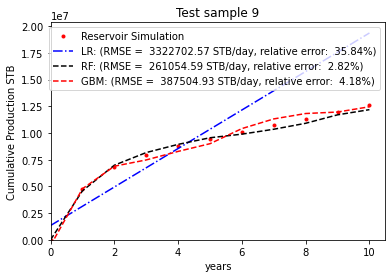

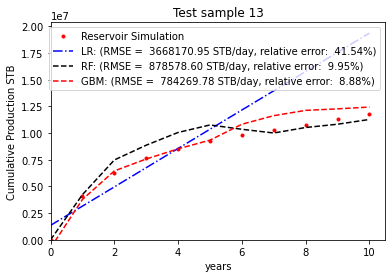

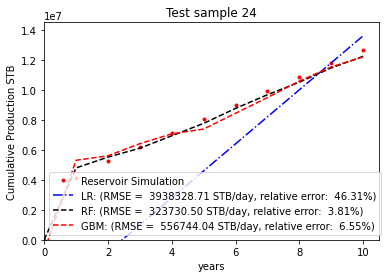

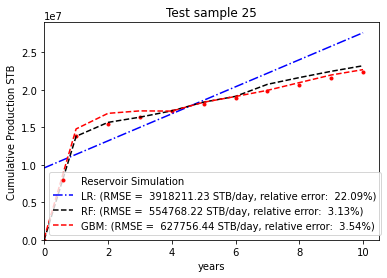

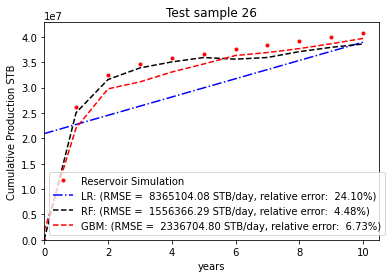

...

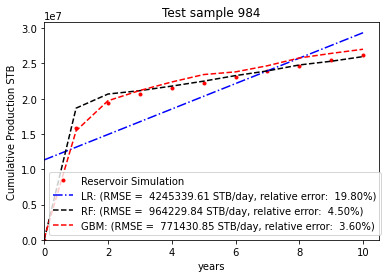

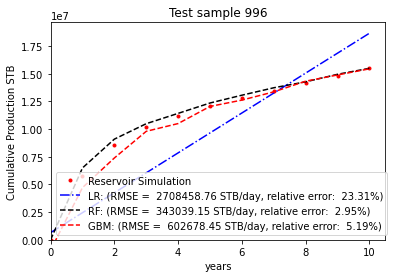

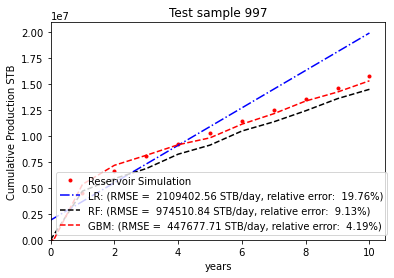

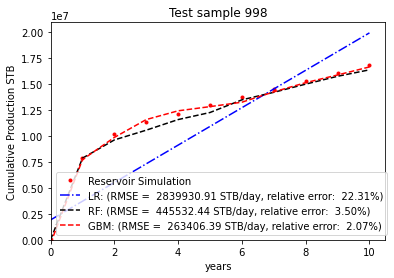

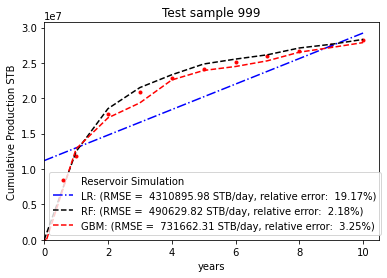

In [46]:
test_case = dataset_test_PC['cn'].unique()

for isample in test_case:
    
    df = dataset_test_PC[dataset_test_PC['cn'] == isample]
    
    rmse_lr = get_rmse(df['yearlyProdCum'], df['PC_pred_lr'])   
    rmse_RF = get_rmse(df['yearlyProdCum'], df['PC_pred_RF'])
    rmse_gbm = get_rmse(df['yearlyProdCum'], df['PC_pred_gbm'])   
    l2_lr = get_rel_l2_error(df['yearlyProdCum'], df['PC_pred_lr']) * 100
    l2_RF = get_rel_l2_error(df['yearlyProdCum'], df['PC_pred_RF']) * 100
    l2_gbm = get_rel_l2_error(df['yearlyProdCum'], df['PC_pred_gbm']) * 100
    
    plt.plot(df['yearstep'], df['yearlyProdCum'], 'r.', label='Reservoir Simulation')
    plt.plot(df['yearstep'], df['PC_pred_lr'], 'b-.', 
             label=f'LR: (RMSE = {rmse_lr: .2f} STB/day, relative error: {l2_lr: .2f}%)')
    plt.plot(df['yearstep'], df['PC_pred_RF'], 'k--', 
             label=f'RF: (RMSE = {rmse_RF: .2f} STB/day, relative error: {l2_RF: .2f}%)')
    plt.plot(df['yearstep'], df['PC_pred_gbm'], 'r--', 
             label=f'GBM: (RMSE = {rmse_gbm: .2f} STB/day, relative error: {l2_gbm: .2f}%)')
        
    plt.xlim(xmin=0)
    plt.ylim(ymin=0)
    plt.xlabel('years')
    plt.ylabel('Cumulative Production STB')
    plt.title(f'Test sample {isample}')
    plt.legend()
    plt.show()            

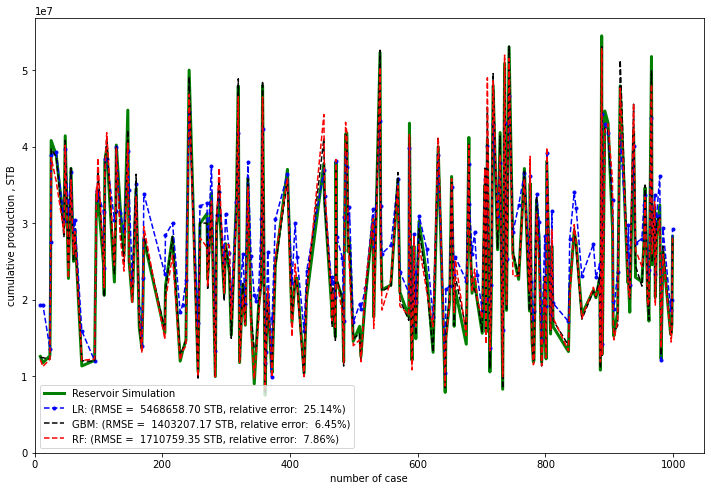

In [54]:
plt.figure(figsize = (12,8))
caseNumber = dataset_test_PC['cn'].unique()
finalCumProd = dataset_test_PC[(dataset_test_PC["yearstep"] == 10)]
plt.plot(caseNumber,finalCumProd['yearlyProdCum'], 'g',label='Reservoir Simulation', linewidth=3)
plt.plot(caseNumber,finalCumProd['PC_pred_lr'], 'b--.', 
             label=f'LR: (RMSE = {score_rmse_by_lr: .2f} STB, relative error: {score_rel_error_lr: .2f}%)')
plt.plot(caseNumber,finalCumProd['PC_pred_gbm'], 'k--', 
             label=f'GBM: (RMSE = {score_rmse_by_gbm: .2f} STB, relative error: {score_rel_error_gbm: .2f}%)')
plt.plot(caseNumber,finalCumProd['PC_pred_RF'], 'r--', 
             label=f'RF: (RMSE = {score_rmse_by_RF: .2f} STB, relative error: {score_rel_error_RF: .2f}%)')

plt.xlim(xmin=0)
plt.ylim(ymin=0)
plt.xlabel('number of case')
plt.ylabel('cumulative production , STB')
plt.legend()
plt.show()        

In [55]:
dataset_test_PC

,cn,yearstep,yearlyProdCum,PC_pred_lr,PC_pred_gbm,PC_pred_RF,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
99,9,0,0.000000e+00,1.337630e+06,-5.266064e+05,0.000000e+00,0.000000,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
100,9,1,4.747688e+06,3.140089e+06,4.781224e+06,4.588451e+06,8362.496450,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
101,9,2,6.818705e+06,4.942549e+06,6.889258e+06,6.983205e+06,4073.983548,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
102,9,3,7.955320e+06,6.745008e+06,7.477441e+06,8.167650e+06,2540.454839,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
103,9,4,8.758568e+06,8.547468e+06,8.275170e+06,8.934038e+06,1998.640000,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,999,6,2.507923e+07,2.200624e+07,2.448895e+07,2.553489e+07,2514.782258,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10996,999,7,2.594121e+07,2.380870e+07,2.529440e+07,2.614470e+07,2261.537419,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10997,999,8,2.674053e+07,2.561116e+07,2.651382e+07,2.710529e+07,2142.944516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10998,999,9,2.751051e+07,2.741362e+07,2.717091e+07,2.762705e+07,2087.474516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test


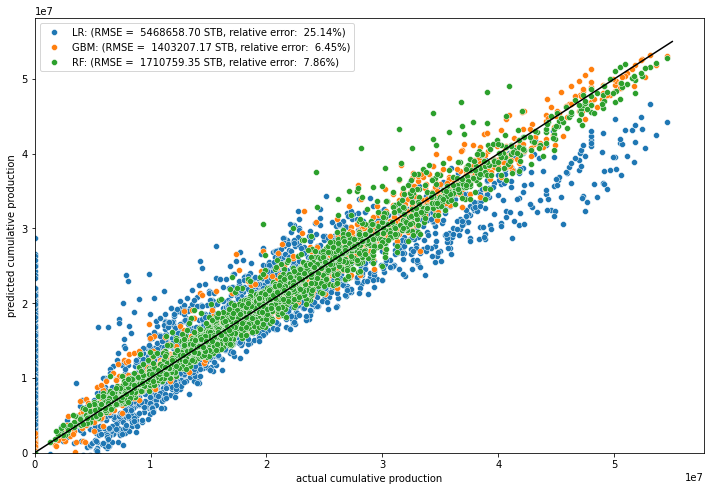

In [56]:

plt.figure(figsize = (12,8))

sns.lineplot(x = [0,55000000],y = [0,55000000],color = 'black')
sns.scatterplot(x= 'yearlyProdCum',y='PC_pred_lr', data = dataset_test_PC,
             label=f'LR: (RMSE = {score_rmse_by_lr: .2f} STB, relative error: {score_rel_error_lr: .2f}%)')
sns.scatterplot(x= 'yearlyProdCum',y='PC_pred_gbm', data = dataset_test_PC,
             label=f'GBM: (RMSE = {score_rmse_by_gbm: .2f} STB, relative error: {score_rel_error_gbm: .2f}%)')
sns.scatterplot(x= 'yearlyProdCum',y='PC_pred_RF', data = dataset_test_PC,
             label=f'RF: (RMSE = {score_rmse_by_RF: .2f} STB, relative error: {score_rel_error_RF: .2f}%)')
plt.xlim(xmin=0)
plt.ylim(ymin=0)
plt.xlabel('actual cumulative production')
plt.ylabel('predicted cumulative production')
plt.legend()
plt.show()        

In [57]:
score_rmse_by_RF = get_rmse(PC_test, PC_test_pred_by_RF)
score_rmse_by_gbm = get_rmse(PC_test, PC_test_pred_by_gbm)
score_rmse_by_lr = get_rmse(PC_test, PC_test_pred_by_lr)

score_rel_error_RF = get_rel_l2_error(PC_test, PC_test_pred_by_RF)*100
score_rel_error_gbm = get_rel_l2_error(PC_test, PC_test_pred_by_gbm)*100
score_rel_error_lr = get_rel_l2_error(PC_test, PC_test_pred_by_lr)*100


R_square_by_RF = r2_score(PC_test, PC_test_pred_by_RF)
R_square_by_gbm = r2_score(PC_test, PC_test_pred_by_gbm)
R_square_by_lr = r2_score(PC_test, PC_test_pred_by_lr)


mae_by_RF = mean_absolute_error(PC_test, PC_test_pred_by_RF)
mae_by_gbm = mean_absolute_error(PC_test, PC_test_pred_by_gbm)
mae_by_lr = mean_absolute_error(PC_test, PC_test_pred_by_lr)


print(f'RMSE of test Cumulative production predicted by Random Forest is {score_rmse_by_RF: .3}.')
print(f'RMSE of test Cumulative production predicted by Gradient boost is {score_rmse_by_gbm: .3}.')
print(f'RMSE of test Cumulative production predicted by linear regression is {score_rmse_by_lr: .3}.')
print('')
print(f'relative error of test cumulative production in 10 years predicted by Random Forest is {score_rel_error_RF: .3}%.')
print(f'relative error of test cumulative production in 10 years predicted by Gradient boost is {score_rel_error_gbm: .3}%.')
print(f'relative error of test cumulative production in 10 years predicted by linear regression is {score_rel_error_lr: .3}%.')
print('')
print(f'R2 of test cumulative production in 10 years predicted by Random Forest is {R_square_by_RF: .3}.')
print(f'R2 of test cumulative production in 10 years predicted by Gradient boost is {R_square_by_gbm: .3}.')
print(f'R2 of test cumulative production in 10 years predicted by linear regression is {R_square_by_lr: .3}.')
print('')
print(f'Mean Absolute Error of test cumulative production in 10 years predicted by Random Forest is {mae_by_RF:.2f}.')
print(f'Mean Absolute Error of test cumulative production in 10 years predicted by Gradient boost is {mae_by_gbm: .2f}.')
print(f'Mean Absolute Error of test cumulative production in 10 years predicted by linear regression is {mae_by_lr: .2f}.')

RMSE of test Cumulative production predicted by Random Forest is  1.71e+06.
RMSE of test Cumulative production predicted by Gradient boost is  1.4e+06.
RMSE of test Cumulative production predicted by linear regression is  5.47e+06.

relative error of test cumulative production in 10 years predicted by Random Forest is  7.86%.
relative error of test cumulative production in 10 years predicted by Gradient boost is  6.45%.
relative error of test cumulative production in 10 years predicted by linear regression is  25.1%.

R2 of test cumulative production in 10 years predicted by Random Forest is  0.979.
R2 of test cumulative production in 10 years predicted by Gradient boost is  0.986.
R2 of test cumulative production in 10 years predicted by linear regression is  0.783.

Mean Absolute Error of test cumulative production in 10 years predicted by Random Forest is 1116620.26.
Mean Absolute Error of test cumulative production in 10 years predicted by Gradient boost is  940879.13.
Mean Absolut

# Objective 2 - Oil production rate at each year

## Develop machine/deep learning model(s) (sklearn or PyTroch) which is able to predict oil production rate at year 1, 2, 3, 4, 5, 6, 7, 8, 9, 10 simultaneously (not the scenario of time window sliding that we know oil production rate at year 1, and then predict the same variable at year 2 or later years).

In [59]:
df_validation_final

,cn,yearstep,yearlyProdCum,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
0,0,0,0.000000e+00,0.000000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
1,0,1,5.102400e+06,7043.058708,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
2,0,2,6.653018e+06,2864.340000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
3,0,3,7.489690e+06,2008.434194,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
4,0,4,8.180167e+06,1833.900323,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
...,...,...,...,...,...,...,...,...,...,...,...
10995,999,6,2.507923e+07,2514.782258,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10996,999,7,2.594121e+07,2261.537419,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10997,999,8,2.674053e+07,2142.944516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10998,999,9,2.751051e+07,2087.474516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test


In [60]:
dataset_train_OR = df_validation_final.loc[df_validation_final['category']=='train']
dataset_test_OR = df_validation_final.loc[df_validation_final['category']=='test']

In [61]:
feature_cols = ['yearstep','Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp', 'thickness']
label_col = ['yearlyProdRate']

In [62]:
# Only take the training data to build the model first
X_train = dataset_train_OR[feature_cols].values
Y_train = dataset_train_OR[label_col].values

In [63]:
# Define scalers based on MinMax, but you can also try Standard Scaler
input_scaler = MinMaxScaler().fit(X_train)
output_scaler = MinMaxScaler().fit(Y_train)

# Transform data
X_train_scaled = input_scaler.transform(X_train)
Y_train_scaled = output_scaler.transform(Y_train)

# Flatten Y to avoid warning in fit models
Y_train_scaled = Y_train_scaled.flatten()

In [64]:
# Test options and evaluation metric
num_folds = 10 # Split the dataset into 10 folds(parts), train model on 9 folds and hold 1 fold for cross validation
seed = 7
scoring = 'neg_root_mean_squared_error' # Root Mean Squared Error

In [65]:

results = []
names = []
time_PC = []

for name, model in models:
    start_time = time.time()
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train_scaled, Y_train_scaled, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    time_PC.append(time.time() - start_time)
    print(msg)
    print("--- %s seconds ---" % (time.time() - start_time))

LR: -0.098029 (0.004889)
--- 0.025674104690551758 seconds ---
RF: -0.012583 (0.001283)
--- 26.102415084838867 seconds ---
GBM: -0.029657 (0.002627)
--- 8.091596364974976 seconds ---
SVR: -0.094518 (0.004431)
--- 8.981469869613647 seconds ---


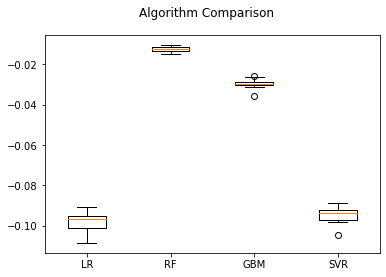

In [66]:
# Compare Algorithms
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [67]:
X_test = dataset_test_OR[feature_cols].values
oilRate_test = dataset_test_OR[label_col].values

X_test_scaled = input_scaler.transform(X_test)
oilRate_test_scaled = output_scaler.transform(oilRate_test)
oilRate_test_scaled = oilRate_test_scaled.flatten()
oilRate_test_scaled.shape

(2200,)

In [70]:
time_OR_pred=[]
start_time = time.time()
# prepare the RF model
RF_model = RandomForestRegressor(random_state=seed)

# Fit the model 
RF_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
oilRate_test_scaled_pred_by_RF = RF_model.predict(X_test_scaled).reshape(-1, 1)

# Inversely transform the validation dataset back
oilRate_test_pred_by_RF = output_scaler.inverse_transform(oilRate_test_scaled_pred_by_RF)
time_OR_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 2.77915620803833 seconds ---


In [71]:
start_time = time.time()
# prepare the linear model
linear_model = LinearRegression()

# Fit the model 
linear_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
oilRate_test_scaled_pred_by_lr = linear_model.predict(X_test_scaled).reshape(-1, 1)
 
# Inversely transform the validation dataset back
oilRate_test_pred_by_lr = output_scaler.inverse_transform(oilRate_test_scaled_pred_by_lr)
time_OR_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.0028641223907470703 seconds ---


In [72]:
start_time = time.time()
# prepare the gbm model
gbm_model = GradientBoostingRegressor(random_state=seed, n_estimators=400)

# Fit the model 
gbm_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
oilRate_test_scaled_pred_by_gbm = gbm_model.predict(X_test_scaled).reshape(-1, 1)

# Inversely transform the validation dataset back
oilRate_test_pred_by_gbm = output_scaler.inverse_transform(oilRate_test_scaled_pred_by_gbm)
time_OR_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 2.888382911682129 seconds ---


In [73]:
score_rmse_by_RF_oilRate = get_rmse(oilRate_test, oilRate_test_pred_by_RF)
score_rmse_by_gbm_oilRate = get_rmse(oilRate_test, oilRate_test_pred_by_gbm)
score_rmse_by_lr_oilRate = get_rmse(oilRate_test, oilRate_test_pred_by_lr)

score_rel_error_RF_oilRate = get_rel_l2_error(oilRate_test, oilRate_test_pred_by_RF)*100
score_rel_error_gbm_oilRate = get_rel_l2_error(oilRate_test, oilRate_test_pred_by_gbm)*100
score_rel_error_lr_oilRate = get_rel_l2_error(oilRate_test, oilRate_test_pred_by_lr)*100

R_square_by_RF_oilRate = r2_score(oilRate_test, oilRate_test_pred_by_RF)
R_square_by_gbm_oilRate = r2_score(oilRate_test, oilRate_test_pred_by_gbm)
R_square_by_lr_oilRate = r2_score(oilRate_test, oilRate_test_pred_by_lr)


mae_by_RF_oilRate = mean_absolute_error(oilRate_test, oilRate_test_pred_by_RF)
mae_by_gbm_oilRate = mean_absolute_error(oilRate_test, oilRate_test_pred_by_gbm)
mae_by_lr_oilRate = mean_absolute_error(oilRate_test, oilRate_test_pred_by_lr)

print(f'RMSE of test production rate predicted by Random Forest is {score_rmse_by_RF_oilRate: .3e}.')
print(f'RMSE of test production rate predicted by Gradient boost is {score_rmse_by_gbm_oilRate: .3e}.')
print(f'RMSE of test production rate predicted by linear regression is {score_rmse_by_lr_oilRate: .3e}.')
print('')
print(f'relative error of test production rate for each year predicted by Random Forest is {score_rel_error_RF_oilRate: .3}%.')
print(f'relative error of test production rate for each year years predicted by Gradient boost is {score_rel_error_gbm_oilRate: .3}%.')
print(f'relative error of test production rate for each year years predicted by linear regression is {score_rel_error_lr_oilRate: .3}%.')

print('')
print(f'R2 of test production rate predicted by Random Forest is {R_square_by_RF_oilRate: .3}.')
print(f'R2 of test production rate predicted by Gradient boost is {R_square_by_gbm_oilRate: .3}.')
print(f'R2 of test production rate predicted by linear regression is {R_square_by_lr_oilRate: .3}.')
print('')
print(f'Mean Absolute Error of test production rate predicted by Random Forest is {mae_by_RF_oilRate:.2f}.')
print(f'Mean Absolute Error of test production rate predicted by Gradient boost is {mae_by_gbm_oilRate: .2f}.')
print(f'Mean Absolute Error of test production rate predicted by linear regression is {mae_by_lr_oilRate: .2f}.')

RMSE of test production rate predicted by Random Forest is  7.280e+02.
RMSE of test production rate predicted by Gradient boost is  1.136e+03.
RMSE of test production rate predicted by linear regression is  5.173e+03.

relative error of test production rate for each year predicted by Random Forest is  10.0%.
relative error of test production rate for each year years predicted by Gradient boost is  15.6%.
relative error of test production rate for each year years predicted by linear regression is  71.1%.

R2 of test production rate predicted by Random Forest is  0.985.
R2 of test production rate predicted by Gradient boost is  0.963.
R2 of test production rate predicted by linear regression is  0.224.

Mean Absolute Error of test production rate predicted by Random Forest is 322.72.
Mean Absolute Error of test production rate predicted by Gradient boost is  613.95.
Mean Absolute Error of test production rate predicted by linear regression is  2962.58.


In [74]:

data2 = {'RMSE': [score_rmse_by_RF_oilRate, score_rmse_by_gbm_oilRate,score_rmse_by_lr_oilRate], 
        'relative error': [score_rel_error_RF_oilRate,score_rel_error_gbm_oilRate,score_rel_error_lr_oilRate],
        'R2': [R_square_by_RF_oilRate,R_square_by_gbm_oilRate,R_square_by_lr_oilRate],
        'MAE': [mae_by_RF_oilRate,mae_by_gbm_oilRate,mae_by_lr_oilRate]}  
OilRate_evalutaion = pd.DataFrame(data2,index =['RF',
                                          'GBM',
                                          'LR'])
 
OilRate_evalutaion.round(3)

,RMSE,relative error,R2,MAE
RF,727.985,10.008,0.985,322.723
GBM,1135.752,15.614,0.963,613.954
LR,5172.642,71.112,0.224,2962.578


In [75]:
dataset_test_OR.insert(4,column='oilRate_pred_RF', value=oilRate_test_pred_by_RF, allow_duplicates=False)
dataset_test_OR.insert(4, column='oilRate_pred_gbm', value=oilRate_test_pred_by_gbm, allow_duplicates=False)
dataset_test_OR.insert(4, column='oilRate_pred_lr', value=oilRate_test_pred_by_lr, allow_duplicates=False)

In [76]:
dataset_test_OR

,cn,yearstep,yearlyProdCum,yearlyProdRate,oilRate_pred_lr,oilRate_pred_gbm,oilRate_pred_RF,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
99,9,0,0.000000e+00,0.000000,6196.853096,-325.833297,0.000000,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
100,9,1,4.747688e+06,8362.496450,5572.657944,11540.483889,8075.243792,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
101,9,2,6.818705e+06,4073.983548,4948.462793,5588.204005,4601.372787,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
102,9,3,7.955320e+06,2540.454839,4324.267641,3238.920209,3165.505571,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
103,9,4,8.758568e+06,1998.640000,3700.072490,2116.116833,2424.470307,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,999,6,2.507923e+07,2514.782258,4588.838155,2585.528067,2308.788013,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10996,999,7,2.594121e+07,2261.537419,3964.643003,2302.001072,2146.858355,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10997,999,8,2.674053e+07,2142.944516,3340.447852,2220.488605,2094.767603,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10998,999,9,2.751051e+07,2087.474516,2716.252700,2128.295061,2081.656268,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test


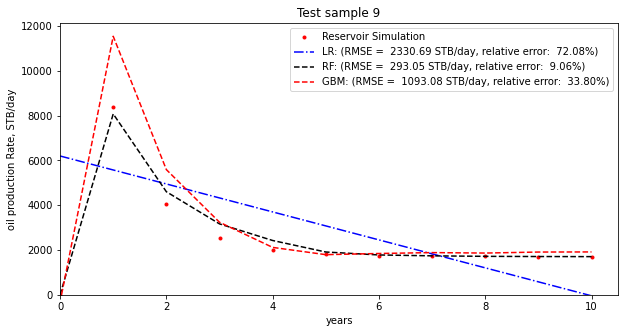

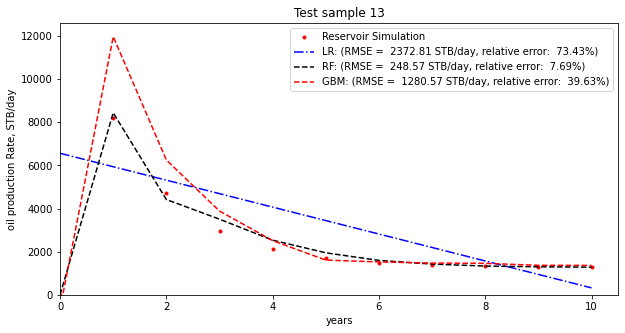

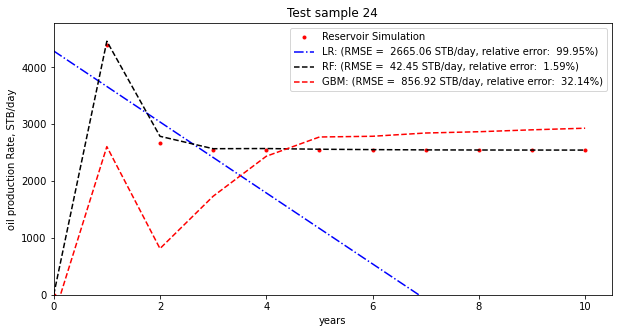

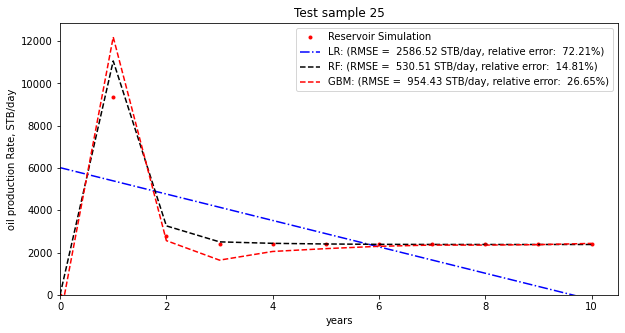

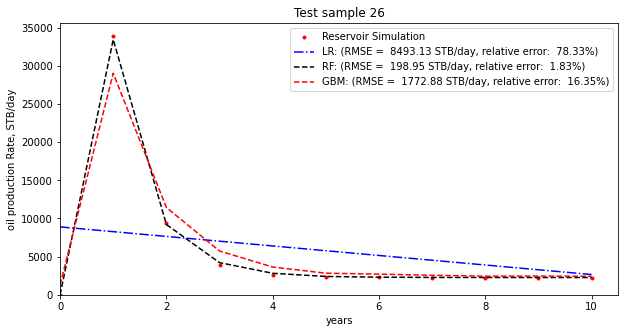

...

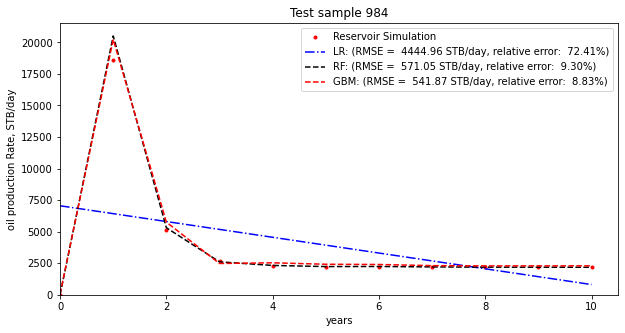

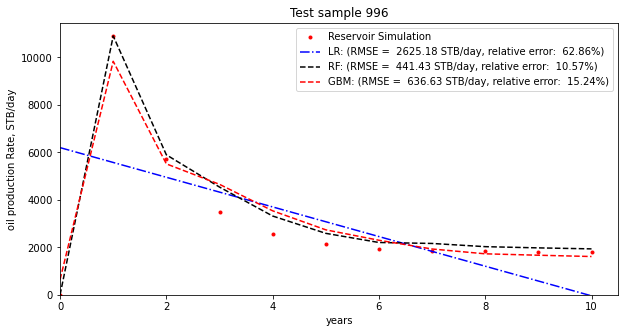

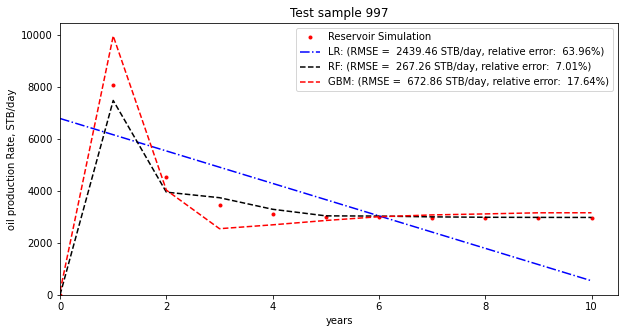

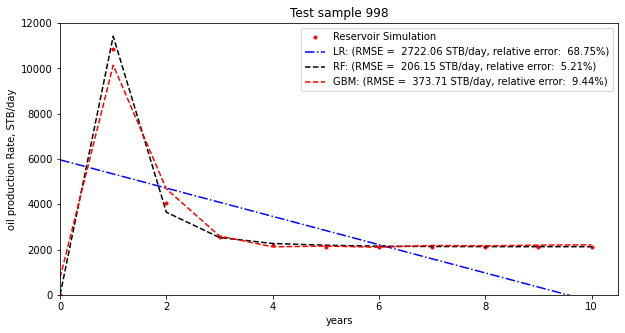

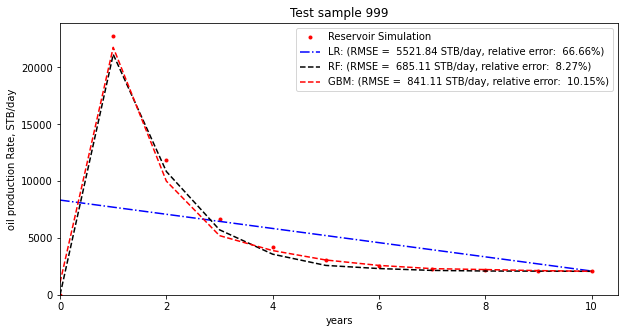

In [78]:
test_case = dataset_test_OR['cn'].unique()

for isample in test_case:
    
    df = dataset_test_OR[dataset_test_OR['cn'] == isample]
    
    rmse_lr = get_rmse(df['yearlyProdRate'], df['oilRate_pred_lr'])   
    rmse_RF = get_rmse(df['yearlyProdRate'], df['oilRate_pred_RF'])
    rmse_gbm = get_rmse(df['yearlyProdRate'], df['oilRate_pred_gbm'])
    l2_lr = get_rel_l2_error(df['yearlyProdRate'], df['oilRate_pred_lr']) * 100
    l2_RF = get_rel_l2_error(df['yearlyProdRate'], df['oilRate_pred_RF']) * 100
    l2_gbm = get_rel_l2_error(df['yearlyProdRate'], df['oilRate_pred_gbm']) * 100
    plt.figure(figsize = (10,5))
    plt.plot(df['yearstep'], df['yearlyProdRate'], 'r.', label='Reservoir Simulation')
    plt.plot(df['yearstep'], df['oilRate_pred_lr'], 'b-.', 
             label=f'LR: (RMSE = {rmse_lr: .2f} STB/day, relative error: {l2_lr: .2f}%)')
    plt.plot(df['yearstep'], df['oilRate_pred_RF'], 'k--', 
             label=f'RF: (RMSE = {rmse_RF: .2f} STB/day, relative error: {l2_RF: .2f}%)')
    plt.plot(df['yearstep'], df['oilRate_pred_gbm'], 'r--', 
             label=f'GBM: (RMSE = {rmse_gbm: .2f} STB/day, relative error: {l2_gbm: .2f}%)')
        
    plt.xlim(xmin=0)
    plt.ylim(ymin=0)
    plt.xlabel('years')
    plt.ylabel('oil production Rate, STB/day')
    plt.title(f'Test sample {isample}')
    plt.legend()
    plt.show()            

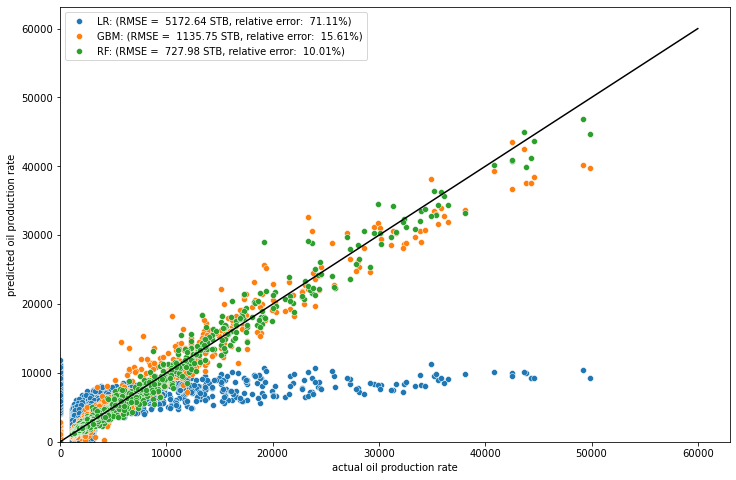

In [79]:

plt.figure(figsize = (12,8))

sns.lineplot(x = [0,60000],y = [0,60000],color = 'black')
sns.scatterplot(x= 'yearlyProdRate',y='oilRate_pred_lr', data = dataset_test_OR,
             label=f'LR: (RMSE = {score_rmse_by_lr_oilRate: .2f} STB, relative error: {score_rel_error_lr_oilRate: .2f}%)')
sns.scatterplot(x= 'yearlyProdRate',y='oilRate_pred_gbm', data = dataset_test_OR,
             label=f'GBM: (RMSE = {score_rmse_by_gbm_oilRate: .2f} STB, relative error: {score_rel_error_gbm_oilRate: .2f}%)')
sns.scatterplot(x= 'yearlyProdRate',y='oilRate_pred_RF', data = dataset_test_OR,
             label=f'RF: (RMSE = {score_rmse_by_RF_oilRate: .2f} STB, relative error: {score_rel_error_RF_oilRate: .2f}%)')
plt.xlim(xmin=0)
plt.ylim(ymin=0)
plt.xlabel('actual oil production rate')
plt.ylabel('predicted oil production rate')
plt.legend()
plt.show()        

In [83]:
score_rmse_by_RF_oilRate = get_rmse(oilRate_test, oilRate_test_pred_by_RF)
score_rmse_by_gbm_oilRate = get_rmse(oilRate_test, oilRate_test_pred_by_gbm)
score_rmse_by_lr_oilRate = get_rmse(oilRate_test, oilRate_test_pred_by_lr)

score_rel_error_RF_oilRate = get_rel_l2_error(oilRate_test, oilRate_test_pred_by_RF)*100
score_rel_error_gbm_oilRate = get_rel_l2_error(oilRate_test, oilRate_test_pred_by_gbm)*100
score_rel_error_lr_oilRate = get_rel_l2_error(oilRate_test, oilRate_test_pred_by_lr)*100

R_square_by_RF_oilRate = r2_score(oilRate_test, oilRate_test_pred_by_RF)
R_square_by_gbm_oilRate = r2_score(oilRate_test, oilRate_test_pred_by_gbm)
R_square_by_lr_oilRate = r2_score(oilRate_test, oilRate_test_pred_by_lr)


mae_by_RF_oilRate = mean_absolute_error(oilRate_test, oilRate_test_pred_by_RF)
mae_by_gbm_oilRate = mean_absolute_error(oilRate_test, oilRate_test_pred_by_gbm)
mae_by_lr_oilRate = mean_absolute_error(oilRate_test, oilRate_test_pred_by_lr)

print(f'RMSE of test production rate predicted by Random Forest is {score_rmse_by_RF_oilRate: .3e}.')
print(f'RMSE of test production rate predicted by Gradient boost is {score_rmse_by_gbm_oilRate: .3e}.')
print(f'RMSE of test production rate predicted by linear regression is {score_rmse_by_lr_oilRate: .3e}.')
print('')
print(f'relative error of test production rate for each year predicted by Random Forest is {score_rel_error_RF_oilRate: .3}%.')
print(f'relative error of test production rate for each year years predicted by Gradient boost is {score_rel_error_gbm_oilRate: .3}%.')
print(f'relative error of test production rate for each year years predicted by linear regression is {score_rel_error_lr_oilRate: .3}%.')

print('')
print(f'R2 of test production rate predicted by Random Forest is {R_square_by_RF_oilRate: .3}.')
print(f'R2 of test production rate predicted by Gradient boost is {R_square_by_gbm_oilRate: .3}.')
print(f'R2 of test production rate predicted by linear regression is {R_square_by_lr_oilRate: .3}.')
print('')
print(f'Mean Absolute Error of test production rate predicted by Random Forest is {mae_by_RF_oilRate:.2f}.')
print(f'Mean Absolute Error of test production rate predicted by Gradient boost is {mae_by_gbm_oilRate: .2f}.')
print(f'Mean Absolute Error of test production rate predicted by linear regression is {mae_by_lr_oilRate: .2f}.')

RMSE of test production rate predicted by Random Forest is  7.280e+02.
RMSE of test production rate predicted by Gradient boost is  1.136e+03.
RMSE of test production rate predicted by linear regression is  5.173e+03.

relative error of test production rate for each year predicted by Random Forest is  10.0%.
relative error of test production rate for each year years predicted by Gradient boost is  15.6%.
relative error of test production rate for each year years predicted by linear regression is  71.1%.

R2 of test production rate predicted by Random Forest is  0.985.
R2 of test production rate predicted by Gradient boost is  0.963.
R2 of test production rate predicted by linear regression is  0.224.

Mean Absolute Error of test production rate predicted by Random Forest is 322.72.
Mean Absolute Error of test production rate predicted by Gradient boost is  613.95.
Mean Absolute Error of test production rate predicted by linear regression is  2962.58.


In [81]:
time_PC_pred

[2.7822911739349365, 3.0442259311676025, 0.03944230079650879]

In [82]:
time_OR_pred

[2.77915620803833, 0.0028641223907470703, 2.888382911682129]

# test of hindercasting

### train the ML model based on first n years data (n < 10) based on training data, and predict the rest of (10-n) years' production rate on  testing data, and see when you increase your "n", how will ML model prediction looks alike.

In [404]:
df_validation_final

,cn,yearstep,yearlyProdCum,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
0,0,0,0.000000e+00,0.000000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
1,0,1,5.102400e+06,7043.058708,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
2,0,2,6.653018e+06,2864.340000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
3,0,3,7.489690e+06,2008.434194,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
4,0,4,8.180167e+06,1833.900323,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
...,...,...,...,...,...,...,...,...,...,...,...
10995,999,6,2.507923e+07,2514.782258,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10996,999,7,2.594121e+07,2261.537419,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10997,999,8,2.674053e+07,2142.944516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test
10998,999,9,2.751051e+07,2087.474516,29.653913,1998.328914,160.051346,0.197521,353.949063,62.922681,test


In [619]:
n =9
dataset_train_HT = df_validation_final.loc[(df_validation_final['category']=='train')&(df_validation_final['yearstep']<n+1)]
dataset_test_HT = df_validation_final.loc[(df_validation_final['category']=='test')&(df_validation_final['yearstep']>n)]


In [620]:
dataset_train_HT

,cn,yearstep,yearlyProdCum,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
0,0,0,0.000000e+00,0.000000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
1,0,1,5.102400e+06,7043.058708,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
2,0,2,6.653018e+06,2864.340000,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
3,0,3,7.489690e+06,2008.434194,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
4,0,4,8.180167e+06,1833.900323,16.423475,1740.711355,288.983333,0.163009,796.992254,23.718632,train
...,...,...,...,...,...,...,...,...,...,...,...
10950,995,5,2.747330e+07,2335.208710,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,train
10951,995,6,2.820956e+07,1814.684839,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,train
10952,995,7,2.882155e+07,1588.713871,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,train
10953,995,8,2.937960e+07,1490.703548,29.041341,1389.699699,267.802153,0.297613,360.783056,49.659116,train


In [621]:
dataset_test_HT

,cn,yearstep,yearlyProdCum,yearlyProdRate,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
109,9,10,1.259402e+07,1707.925484,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
153,13,10,1.175720e+07,1288.665806,81.656518,1244.689219,201.998281,0.266884,607.014230,17.833764,test
274,24,10,1.269906e+07,2541.055161,64.834451,2474.871952,359.580599,0.115379,677.645048,20.282105,test
285,25,10,2.241953e+07,2383.994839,77.406651,2322.897960,462.235830,0.138906,825.767820,65.468888,test
296,26,10,4.083391e+07,2262.650000,93.193350,2214.053245,429.879041,0.260353,559.733786,76.421426,test
...,...,...,...,...,...,...,...,...,...,...,...
10834,984,10,2.626021e+07,2176.820000,58.089319,2121.620296,389.510863,0.201783,798.747861,59.935518,test
10966,996,10,1.548190e+07,1811.702581,18.726684,1760.642289,107.307413,0.118329,619.945236,50.138466,test
10977,997,10,1.574446e+07,2968.620323,79.359722,2888.540632,286.111768,0.220148,463.172938,15.560388,test
10988,998,10,1.681020e+07,2113.007419,64.002001,2068.865519,273.422642,0.162465,421.799002,34.314301,test


In [622]:
feature_cols = ['yearstep','Kh_Kv', 'inj_rate', 'permeability', 'porosity', 'prod_bhp', 'thickness']
label_col = ['yearlyProdRate']

In [623]:
# Only take the training data to build the model first
X_train = dataset_train_HT[feature_cols].values
Y_train = dataset_train_HT[label_col].values

In [624]:
# Define scalers based on MinMax, but you can also try Standard Scaler
input_scaler = MinMaxScaler().fit(X_train)
output_scaler = MinMaxScaler().fit(Y_train)

# Transform data
X_train_scaled = input_scaler.transform(X_train)
Y_train_scaled = output_scaler.transform(Y_train)

# Flatten Y to avoid warning in fit models
Y_train_scaled = Y_train_scaled.flatten()

In [625]:
# Test options and evaluation metric
num_folds = 10 # Split the dataset into 10 folds(parts), train model on 9 folds and hold 1 fold for cross validation
seed = 7
scoring = 'neg_root_mean_squared_error' # Root Mean Squared Error

In [626]:
X_test = dataset_test_HT[feature_cols].values
oilRate_test_HT = dataset_test_HT[label_col].values

X_test_scaled = input_scaler.transform(X_test)
oilRate_test_scaled_HT = output_scaler.transform(oilRate_test_HT)
oilRate_test_scaled_HT = oilRate_test_scaled_HT.flatten()
oilRate_test_scaled_HT.shape

(200,)

In [627]:
time_OR_pred_HT=[]
start_time = time.time()
# prepare the RF model
RF_model = RandomForestRegressor(random_state=seed)

# Fit the model 
RF_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
oilRate_test_scaled_HT_pred_by_RF = RF_model.predict(X_test_scaled).reshape(-1, 1)

# Inversely transform the validation dataset back
oilRate_test_pred_by_RF_HT = output_scaler.inverse_transform(oilRate_test_scaled_HT_pred_by_RF)
time_OR_pred_HT.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 2.809197425842285 seconds ---


In [628]:
start_time = time.time()
# prepare the gbm model
gbm_model = GradientBoostingRegressor(random_state=seed, n_estimators=400)

# Fit the model 
gbm_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
oilRate_test_scaled_HT_pred_by_gbm = gbm_model.predict(X_test_scaled).reshape(-1, 1)

# Inversely transform the validation dataset back
oilRate_test_pred_by_gbm_HT = output_scaler.inverse_transform(oilRate_test_scaled_HT_pred_by_gbm)
time_OR_pred_HT.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 3.1596498489379883 seconds ---


In [629]:
start_time = time.time()
# prepare the linear model
linear_model = LinearRegression()

# Fit the model 
linear_model.fit(X_train_scaled, Y_train_scaled)

# Predict the validation data set 
oilRate_test_scaled_HT_pred_by_lr = linear_model.predict(X_test_scaled).reshape(-1, 1)
 
# Inversely transform the validation dataset back
oilRate_test_pred_by_lr_HT = output_scaler.inverse_transform(oilRate_test_scaled_HT_pred_by_lr)
time_OR_pred.append(time.time() - start_time)
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.0049817562103271484 seconds ---


In [630]:
score_rmse_by_RF_oilRate_HT = get_rmse(oilRate_test_HT, oilRate_test_pred_by_RF_HT)
score_rmse_by_gbm_oilRate_HT = get_rmse(oilRate_test_HT, oilRate_test_pred_by_gbm_HT)
score_rmse_by_lr_oilRate_HT = get_rmse(oilRate_test_HT, oilRate_test_pred_by_lr_HT)

score_rel_error_RF_oilRate_HT = get_rel_l2_error(oilRate_test_HT, oilRate_test_pred_by_RF_HT)
score_rel_error_gbm_oilRate_HT = get_rel_l2_error(oilRate_test_HT, oilRate_test_pred_by_gbm_HT)
score_rel_error_lr_oilRate_HT = get_rel_l2_error(oilRate_test_HT, oilRate_test_pred_by_lr_HT)

R_square_by_RF_oilRate_HT = r2_score(oilRate_test_HT, oilRate_test_pred_by_RF_HT)
R_square_by_gbm_oilRate_HT = r2_score(oilRate_test_HT, oilRate_test_pred_by_gbm_HT)
R_square_by_lr_oilRate_HT = r2_score(oilRate_test_HT, oilRate_test_pred_by_lr_HT)


mae_by_RF_oilRate_HT = mean_absolute_error(oilRate_test_HT, oilRate_test_pred_by_RF_HT)
mae_by_gbm_oilRate_HT = mean_absolute_error(oilRate_test_HT, oilRate_test_pred_by_gbm_HT)
mae_by_lr_oilRate_HT = mean_absolute_error(oilRate_test_HT, oilRate_test_pred_by_lr_HT)

print(f'RMSE of test production rate predicted by Random Forest is {score_rmse_by_RF_oilRate_HT: .3e}.')
print(f'RMSE of test production rate predicted by Gradient boost is {score_rmse_by_gbm_oilRate_HT: .3e}.')
print(f'RMSE of test production rate predicted by linear regression is {score_rmse_by_lr_oilRate_HT: .3e}.')
print('')
print(f'relative error of test production rate for each year predicted by Random Forest is {score_rel_error_RF_oilRate_HT: .3}%.')
print(f'relative error of test production rate for each year years predicted by Gradient boost is {score_rel_error_gbm_oilRate_HT: .3}%.')
print(f'relative error of test production rate for each year years predicted by linear regression is {score_rel_error_lr_oilRate_HT: .3}%.')

print('')
print(f'R2 of test production rate predicted by Random Forest is {R_square_by_RF_oilRate_HT: .3}.')
print(f'R2 of test production rate predicted by Gradient boost is {R_square_by_gbm_oilRate_HT: .3}.')
print(f'R2 of test production rate predicted by linear regression is {R_square_by_lr_oilRate_HT: .3}.')
print('')
print(f'Mean Absolute Error of test production rate predicted by Random Forest is {mae_by_RF_oilRate_HT:.2f}.')
print(f'Mean Absolute Error of test production rate predicted by Gradient boost is {mae_by_gbm_oilRate_HT: .2f}.')
print(f'Mean Absolute Error of test production rate predicted by linear regression is {mae_by_lr_oilRate_HT: .2f}.')

RMSE of test production rate predicted by Random Forest is  1.651e+02.
RMSE of test production rate predicted by Gradient boost is  3.813e+02.
RMSE of test production rate predicted by linear regression is  2.243e+03.

relative error of test production rate for each year predicted by Random Forest is  0.0733%.
relative error of test production rate for each year years predicted by Gradient boost is  0.169%.
relative error of test production rate for each year years predicted by linear regression is  0.996%.

R2 of test production rate predicted by Random Forest is  0.943.
R2 of test production rate predicted by Gradient boost is  0.694.
R2 of test production rate predicted by linear regression is -9.6.

Mean Absolute Error of test production rate predicted by Random Forest is 65.96.
Mean Absolute Error of test production rate predicted by Gradient boost is  278.87.
Mean Absolute Error of test production rate predicted by linear regression is  1835.39.


In [631]:
dataset_test_HT.insert(4,column='oilRate_pred_RF_HT', value=oilRate_test_pred_by_RF_HT, allow_duplicates=False)
dataset_test_HT.insert(4, column='oilRate_pred_gbm_HT', value=oilRate_test_pred_by_gbm_HT, allow_duplicates=False)
dataset_test_HT.insert(4, column='oilRate_pred_lr_HT', value=oilRate_test_pred_by_lr_HT, allow_duplicates=False)

In [632]:
dataset_test_HT.head()

,cn,yearstep,yearlyProdCum,yearlyProdRate,oilRate_pred_lr_HT,oilRate_pred_gbm_HT,oilRate_pred_RF_HT,Kh_Kv,inj_rate,permeability,porosity,prod_bhp,thickness,category
109,9,10,1.259402e+07,1707.925484,-636.990307,2055.362507,1710.488116,42.494315,1671.382942,259.124329,0.229653,302.130499,17.101153,test
153,13,10,1.175720e+07,1288.665806,-199.827454,1628.907573,1285.991039,81.656518,1244.689219,201.998281,0.266884,607.014230,17.833764,test
274,24,10,1.269906e+07,2541.055161,-2790.199124,3070.941424,2546.713610,64.834451,2474.871952,359.580599,0.115379,677.645048,20.282105,test
285,25,10,2.241953e+07,2383.994839,-876.080675,2725.754337,2380.829045,77.406651,2322.897960,462.235830,0.138906,825.767820,65.468888,test
296,26,10,4.083391e+07,2262.650000,2284.856632,2507.444363,2269.030571,93.193350,2214.053245,429.879041,0.260353,559.733786,76.421426,test


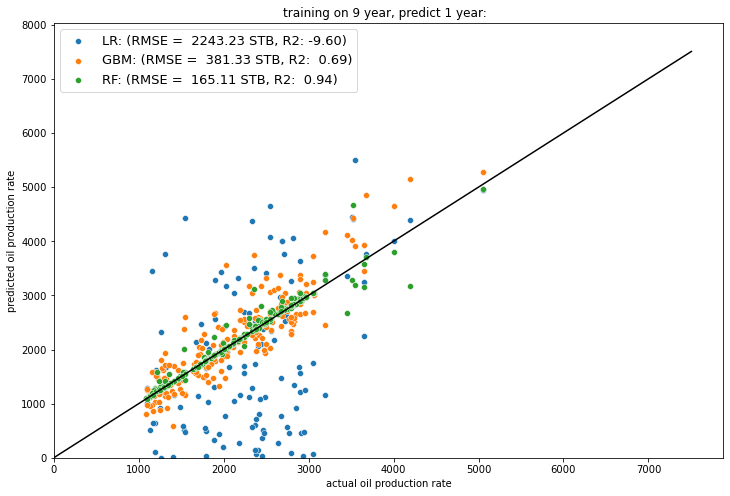

In [633]:

plt.figure(figsize = (12,8))
axlim = max(dataset_test_HT['oilRate_pred_lr_HT'])+2000
sns.lineplot(x = [0,axlim],y = [0,axlim],color = 'black')
sns.scatterplot(x= 'yearlyProdRate',y='oilRate_pred_lr_HT', data = dataset_test_HT,
             label=f'LR: (RMSE = {score_rmse_by_lr_oilRate_HT: .2f} STB, R2: {R_square_by_lr_oilRate_HT: .2f})')
sns.scatterplot(x= 'yearlyProdRate',y='oilRate_pred_gbm_HT', data = dataset_test_HT,
             label=f'GBM: (RMSE = {score_rmse_by_gbm_oilRate_HT: .2f} STB, R2: {R_square_by_gbm_oilRate_HT: .2f})')
sns.scatterplot(x= 'yearlyProdRate',y='oilRate_pred_RF_HT', data = dataset_test_HT,
             label=f'RF: (RMSE = {score_rmse_by_RF_oilRate_HT: .2f} STB, R2: {R_square_by_RF_oilRate_HT: .2f})')
plt.xlim(xmin=0)
plt.ylim(ymin=0)
plt.xlabel('actual oil production rate')
plt.ylabel('predicted oil production rate')
plt.title(f'training on {n} year, predict {(10-n)} year:  ')
plt.legend(prop={'size':13})
plt.show()        